<a href="https://colab.research.google.com/github/sonyharianto1991/multicriteria_healthcheck/blob/main/production_multi_criteria.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Block 0 – Imports & Helper**

In [2]:
import time
import numpy as np
from scipy.stats import entropy, wilcoxon
from dataclasses import dataclass
from typing import Optional, Dict, List
import torch
import torch.nn.functional as F

**Block 1 – PSI, KL, Confidence**

In [3]:
def clamp01(x):
    return max(0.0, min(1.0, float(x)))


def compute_hist(prob_array, n_bins=10):
    """Simple histogram in [0,1] for PSI/KL."""
    hist, bin_edges = np.histogram(prob_array, bins=n_bins, range=(0.0, 1.0))
    # convert to probabilities
    hist = hist.astype(float)
    hist = hist / (hist.sum() + 1e-8)
    return hist, bin_edges


def compute_psi(base_probs, cur_probs, n_bins=10):
    """Population Stability Index between baseline and current."""
    p, _ = compute_hist(base_probs, n_bins)
    q, _ = compute_hist(cur_probs, n_bins)
    # avoid zero
    p = np.clip(p, 1e-6, 1)
    q = np.clip(q, 1e-6, 1)
    psi = np.sum((p - q) * np.log(p / q))
    return float(psi)

def compute_kl(base_probs, cur_probs, n_bins=10):
    """KL divergence between baseline and current histograms."""
    p, _ = compute_hist(base_probs, n_bins)
    q, _ = compute_hist(cur_probs, n_bins)
    p = np.clip(p, 1e-6, 1)
    q = np.clip(q, 1e-6, 1)
    return float(entropy(p, q))  # KL(p||q)

def compute_stability_components(
    base_probs: np.ndarray,
    cur_probs: np.ndarray,
    base_pos_rate: float,
    cur_pos_rate: float,
):
    """
    Hitung 3 komponen untuk stability:
    - PSI (input/output)
    - KL divergence
    - class distribution shift
    """
    psi = compute_psi(base_probs, cur_probs)
    kl = compute_kl(base_probs, cur_probs)
    diff_rate = abs(cur_pos_rate - base_pos_rate)
    return psi, kl, diff_rate

def compute_confidence_stats(
    probs: np.ndarray,
    base_conf: float,
):
    """
    probs: array [N, num_classes] (softmax).
    base_conf: rata-rata max prob baseline.
    """
    max_conf = probs.max(axis=1)
    avg_conf = float(max_conf.mean())
    var_conf = float(max_conf.var())
    ratio_conf = avg_conf / (base_conf + 1e-8)
    return avg_conf, var_conf, ratio_conf

**Block 2 – Normalisasi & Composite Score D_prod**

In [4]:
@dataclass
class ProductionMetrics:
    psi: float
    kl: float
    class_shift: float
    ratio_conf: float
    p95_latency_ms: float
    baseline_p95_latency_ms: float
    flag_rate: Optional[float] = None
    baseline_flag_rate: Optional[float] = None

def compute_stability_norm(m: ProductionMetrics) -> float:
    # clip terhadap “worst case” supaya tidak meledak
    psi_norm_bad = clamp01(m.psi / 0.25)   # PSI > 0.25 = drift berat
    kl_norm_bad = clamp01(m.kl / 0.5)      # KL > 0.5  = drift berat
    diff_norm_bad = clamp01(m.class_shift / 0.2)  # shift 20 poin = parah

    psi_good = 1.0 - psi_norm_bad
    kl_good = 1.0 - kl_norm_bad
    dist_good = 1.0 - diff_norm_bad

    return (psi_good + kl_good + dist_good) / 3.0

def compute_confidence_norm(m: ProductionMetrics) -> float:
    # ratio_conf diharapkan sekitar 1
    ratio = float(m.ratio_conf)
    ratio = max(0.5, min(1.5, ratio))
    deviation = abs(ratio - 1.0) / 0.5  # 0–1
    return 1.0 - deviation


def compute_latency_good(m: ProductionMetrics) -> float:
    ratio = m.p95_latency_ms / (m.baseline_p95_latency_ms + 1e-8)
    ratio = max(1.0, min(2.0, ratio))   # 1x–2x baseline
    norm_bad = (ratio - 1.0) / 1.0      # 0–1
    return 1.0 - norm_bad               # 1 = sama baseline, 0 = 2x lebih lambat


def compute_error_good(m: ProductionMetrics) -> float:
    ratio = max(1.0, min(3.0, ratio))   # sampai 3x baseline
    norm_bad = (ratio - 1.0) / 2.0      # 0–1
    return 1.0 - norm_bad               # 1 = sehat, 0 = 3x lebih buruk


def compute_biz_norm(m: ProductionMetrics) -> float:
    if m.flag_rate is None or m.baseline_flag_rate is None:
        return 0.0  # kalau tidak dipakai
    ratio = m.flag_rate / (m.baseline_flag_rate + 1e-8)
    ratio = max(0.5, min(1.5, ratio))
    deviation = abs(ratio - 1.0) / 0.5
    return 1.0 - deviation


def compute_composite_production(
    m: ProductionMetrics,
    w_stab: float = 0.35,
    w_conf: float = 0.20,
    w_lat:  float = 0.20,
    w_biz:  float = 0.10,
) -> float:
    """Hitung D_prod (0–1) dari berbagai komponen."""
    w_sum = w_stab + w_conf + w_lat + w_biz
    w_stab, w_conf, w_lat, w_biz = [
        w / w_sum for w in (w_stab, w_conf, w_lat, w_biz)
    ]

    stab_norm = compute_stability_norm(m)
    conf_norm = compute_confidence_norm(m)
    lat_good  = compute_latency_good(m)
    biz_norm  = compute_biz_norm(m)

    D_prod = (
        w_stab * stab_norm +
        w_conf * conf_norm +
        w_lat  * lat_good  +
        w_biz  * biz_norm
    )
    return float(D_prod)

**Block 3 – Contoh Inference Loop per Skenario**

In [5]:
def run_inference_collect(
    model,
    dataloader,
    device,
):
    model.eval()
    all_probs = []
    latencies_ms = []
    error_count = 0
    total_count = 0

    with torch.no_grad():
        for imgs, _ in dataloader:   # label boleh diabaikan di production
            imgs = imgs.to(device)
            start = time.time()
            try:
                logits = model(imgs)
                probs = F.softmax(logits, dim=1).cpu().numpy()
                all_probs.append(probs)
            except Exception as e:
                # kalau terjadi error inferensi
                error_count += len(imgs)
            end = time.time()

            elapsed_ms = (end - start) * 1000.0
            latencies_ms.append(elapsed_ms)
            total_count += len(imgs)

    if len(all_probs) == 0:
        probs_concat = np.zeros((0, 2))
    else:
        probs_concat = np.concatenate(all_probs, axis=0)

    latencies_ms = np.array(latencies_ms)

    return probs_concat, latencies_ms

**Buat baseline_loader**

In [6]:
from torchvision import transforms

baseline_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],   # ImageNet normalization
        std=[0.229, 0.224, 0.225]
    ),
])

In [7]:
from torchvision import datasets
from torch.utils.data import DataLoader

baseline_dataset_path = "/content/drive/MyDrive/TESIS/dataset/test"  # ganti sesuai lokasi dataset kamu

baseline_dataset = datasets.ImageFolder(
    root=baseline_dataset_path,
    transform=baseline_transform
)

baseline_loader = DataLoader(
    baseline_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,   # bebas, bisa 0 kalau di Colab CPU
    pin_memory=True
)

print("✅ baseline_loader created — total images:", len(baseline_dataset))

✅ baseline_loader created — total images: 76


**Definisikan Model** - Load Model Baseline (pth)

In [8]:
import torch
import torch.nn as nn
from torchvision import models

num_classes = 2  # helmet / no_helmet

# 1) Definisikan arsitektur yang sama seperti saat training
model = models.mobilenet_v3_small(weights=None)
model.classifier[3] = nn.Linear(
    in_features=model.classifier[3].in_features,
    out_features=num_classes
)

# 2) Load state_dict dari file .pth
ckpt_path = "/content/mobilenet_baseline.pth"  # ganti path kalau beda lokasi

state_dict = torch.load(ckpt_path, map_location="cpu")

# 3) Kalau dulu pernah pakai DataParallel, key-nya biasanya ada 'module.'
if any(k.startswith("module.") for k in state_dict.keys()):
    new_state_dict = {}
    for k, v in state_dict.items():
        new_k = k.replace("module.", "", 1)
        new_state_dict[new_k] = v
    state_dict = new_state_dict

# 4) Masukkan ke model
model.load_state_dict(state_dict)

print("✅ Model & weight baseline loaded")

✅ Model & weight baseline loaded


**Pindahkan ke Device & Jalankan Baseline Run**

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# asumsi: baseline_loader = dataloader untuk dataset bersih
base_probs, base_latencies_ms = run_inference_collect(
    model, baseline_loader, device
)

base_max_conf = base_probs.max(axis=1)
baseline_conf = float(base_max_conf.mean())
baseline_pos_rate = float((base_probs[:,1] > 0.5).mean())  # contoh utk kelas 1
baseline_p95_latency = float(np.percentile(base_latencies_ms, 95))

# kalau mau pakai flag rate (misalnya proporsi prediksi "pelanggaran")
baseline_flag_rate = baseline_pos_rate

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


**Kode baseline + single metric**

In [10]:
import numpy as np

# --- BASELINE METRICS (multi-criteria) ---
base_max_conf = base_probs.max(axis=1)               # [N]
baseline_conf = float(base_max_conf.mean())
baseline_conf_var = float(base_max_conf.var())
baseline_pos_rate = float((base_probs[:, 1] > 0.5).mean())
baseline_p95_latency = float(np.percentile(base_latencies_ms, 95))
baseline_flag_rate = baseline_pos_rate

metrics_baseline = ProductionMetrics(
    psi=0.0,
    kl=0.0,
    class_shift=0.0,
    ratio_conf=1.0,                      # ← Single metric baseline = 1.0
    p95_latency_ms=baseline_p95_latency,
    baseline_p95_latency_ms=baseline_p95_latency,
    flag_rate=baseline_flag_rate,
    baseline_flag_rate=baseline_flag_rate,
)

D_baseline = compute_composite_production(metrics_baseline)


# --- DEFINISI SINGLE METRIC (CONFIDENCE RATIO) ---
def compute_single_metric(m: ProductionMetrics) -> float:
    """Single metric untuk RQ2: confidence ratio (tanpa label)."""
    return float(m.ratio_conf)


single_baseline = compute_single_metric(metrics_baseline)

print("Baseline – single metric (confidence ratio):", single_baseline)
print("Baseline – composite D_prod:", D_baseline)


# optional: mulai list perbandingan single vs composite
single_vs_composite = []
single_vs_composite.append({
    "Scenario": "Baseline",
    "SingleMetric": single_baseline,
    "D_prod": D_baseline,
})

Baseline – single metric (confidence ratio): 1.0
Baseline – composite D_prod: 0.9999999801307208


**1. Skenario Drift - Lighting**

**1.1 Transform - Lighting**

In [11]:
from torchvision import transforms
from PIL import ImageEnhance

# ini baseline_transform yg sudah dipakai
base_transform_no_norm = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# brightness factor: <1 = makin gelap, >1 = makin terang
BRIGHTNESS_FACTOR = 0.1  # contoh: 0.4 = cukup gelap

class LightingDegradation(object):
    def __init__(self, factor=0.4):
        self.factor = factor

    def __call__(self, img):
        # img di sini masih tipe PIL.Image
        enhancer = ImageEnhance.Brightness(img)
        img = enhancer.enhance(self.factor)
        return img

# transform lengkap utk lighting scenario
lighting_transform = transforms.Compose([
    LightingDegradation(factor=BRIGHTNESS_FACTOR),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])

**1.2 Dataset & Loader - Lighting**

In [12]:
from torchvision import datasets
from torch.utils.data import DataLoader

lighting_dataset_path = "/content/drive/MyDrive/TESIS/dataset/test"

lighting_dataset = datasets.ImageFolder(
    root=lighting_dataset_path,
    transform=lighting_transform,
)

lighting_loader = DataLoader(
    lighting_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

print("✅ lighting_loader created — total images:", len(lighting_dataset))
print("Classes:", lighting_dataset.class_to_idx)

✅ lighting_loader created — total images: 76
Classes: {'1': 0, '2': 1}


**1.3 Preview Images - Lighting**

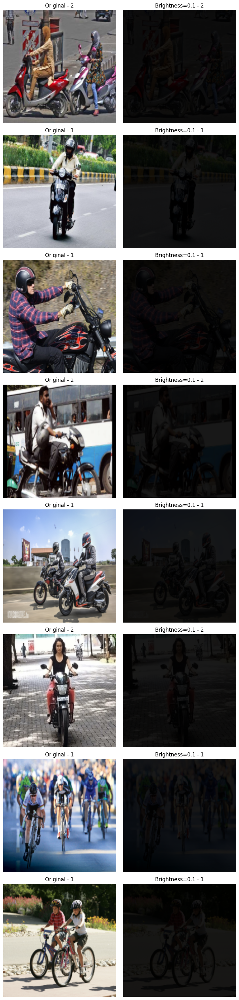

Displayed 8 samples - you should see darker images on the right


In [13]:
# Simplest version - just display inline without saving
# Paste this into ONE cell in your Colab notebook

import matplotlib.pyplot as plt
from torchvision import transforms, datasets
from PIL import ImageEnhance
import random

# Define LightingDegradation
class LightingDegradation(object):
    def __init__(self, factor=0.1):
        self.factor = factor
    def __call__(self, img):
        return ImageEnhance.Brightness(img).enhance(self.factor)

# Load datasets
dataset_path = "/content/drive/MyDrive/TESIS/dataset/test/"

original_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Resize((224, 224))
)

augmented_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Compose([
        LightingDegradation(factor=0.1),
        transforms.Resize((224, 224))
    ])
)

# Display 8 random samples
indices = random.sample(range(len(original_ds)), 8)

fig, axes = plt.subplots(8, 2, figsize=(8, 32))

for row, idx in enumerate(indices):
    orig_img, label = original_ds[idx]
    aug_img, _ = augmented_ds[idx]
    class_name = original_ds.classes[label]

    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"Original - {class_name}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(aug_img)
    axes[row, 1].set_title(f"Brightness=0.1 - {class_name}")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

print("Displayed 8 samples - you should see darker images on the right")

**1.4 Inferensi - Lighting**

In [14]:
# jalankan inferensi di skenario lighting
cur_probs, cur_latencies_ms = run_inference_collect(
    model, lighting_loader, device
)

# === Derivasi metrik dasar ===
cur_max_conf = cur_probs.max(axis=1)
cur_pos_rate = float((cur_probs[:, 1] > 0.5).mean())
p95_latency = float(np.percentile(cur_latencies_ms, 95))

# === Stability metrics ===
psi, kl, class_shift = compute_stability_components(
    base_probs=base_max_conf,        # distribusi confidence baseline
    cur_probs=cur_max_conf,
    base_pos_rate=baseline_pos_rate,
    cur_pos_rate=cur_pos_rate,
)

# === Confidence metrics ===
avg_conf, var_conf, ratio_conf = compute_confidence_stats(
    probs=cur_probs,
    base_conf=baseline_conf,
)

# === Pack metrics (untuk composite) ===
metrics_lighting = ProductionMetrics(
    psi=psi,
    kl=kl,
    class_shift=class_shift,
    ratio_conf=ratio_conf,
    p95_latency_ms=p95_latency,
    baseline_p95_latency_ms=baseline_p95_latency,
    flag_rate=cur_pos_rate,
    baseline_flag_rate=baseline_flag_rate,
)

# === Composite score ===
D_lighting = compute_composite_production(metrics_lighting)

# === PRINT DETAIL METRICS ===
print("===== Lighting Degradation Scenario =====")
print(f"PSI               : {psi:.6f}")
print(f"KL                : {kl:.6f}")
print(f"Class Shift       : {class_shift:.6f}")
print(f"Avg Confidence    : {avg_conf:.6f}")
print(f"Confidence Ratio  : {ratio_conf:.6f}")
print(f"p95 Latency (ms)  : {p95_latency:.3f}")
print(f"D_prod (lighting) : {D_lighting:.6f}")

===== Lighting Degradation Scenario =====
PSI               : 1.631644
KL                : 0.865111
Class Shift       : 0.118421
Avg Confidence    : 0.665203
Confidence Ratio  : 0.789691
p95 Latency (ms)  : 428.203
D_prod (lighting) : 0.427605


**2. Scenario Drift - Blur**

**2.1 Transform - Blur**

In [15]:
from PIL import Image
import cv2
import numpy as np
from torchvision import transforms

class GaussianBlurDegradation(object):
    def __init__(self, kernel_size=5):
        self.kernel_size = kernel_size if kernel_size % 2 == 1 else kernel_size+1

    def __call__(self, img):
        img_cv = np.array(img)
        img_blur = cv2.GaussianBlur(img_cv, (self.kernel_size, self.kernel_size), 0)
        return Image.fromarray(img_blur)


# Atau kalau mau motion blur:
# class MotionBlurDegradation(object):
#     def __init__(self, kernel_size=9):
#         self.kernel_size = kernel_size
#         self.kernel = np.zeros((kernel_size, kernel_size))
#         np.fill_diagonal(self.kernel, 1)
#         self.kernel /= kernel_size
#
#     def __call__(self, img):
#         img_cv = np.array(img)
#         img_blur = cv2.filter2D(img_cv, -1, self.kernel)
#         return Image.fromarray(img_blur)


blur_transform = transforms.Compose([
    GaussianBlurDegradation(kernel_size=5), ### size=5
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

**2.2 Dataset and Loader - Blur**

In [16]:
from torchvision import datasets
from torch.utils.data import DataLoader

blur_dataset_path = "/content/drive/MyDrive/TESIS/dataset/test"

blur_dataset = datasets.ImageFolder(
    root=blur_dataset_path,
    transform=blur_transform,
)

print("Classes:", blur_dataset.class_to_idx)
print("Total blur images:", len(blur_dataset))

blur_loader = DataLoader(
    blur_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("✅ blur_loader created")

Classes: {'1': 0, '2': 1}
Total blur images: 76
✅ blur_loader created


**2.3 Preview Images - Blur**

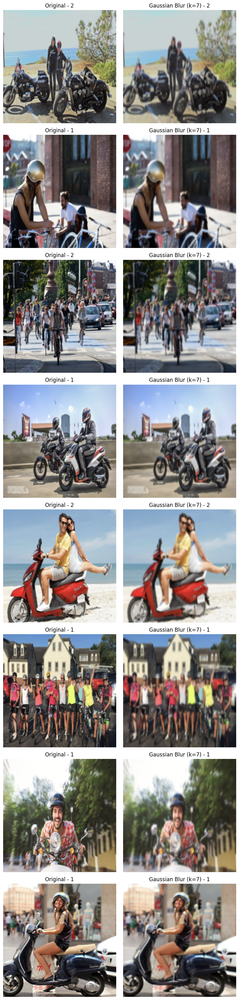

Displayed 8 samples – you should see spatial detail loss on the right


In [17]:
import matplotlib.pyplot as plt
from torchvision import transforms, datasets
from PIL import Image
import cv2
import numpy as np
import random

# === Define GaussianBlurDegradation ===
class GaussianBlurDegradation(object):
    def __init__(self, kernel_size=5):
        self.kernel_size = kernel_size if kernel_size % 2 == 1 else kernel_size + 1

    def __call__(self, img):
        img_np = np.array(img)
        img_blur = cv2.GaussianBlur(
            img_np,
            (self.kernel_size, self.kernel_size),
            sigmaX=0
        )
        return Image.fromarray(img_blur)

# === Dataset path ===
dataset_path = "/content/drive/MyDrive/TESIS/dataset/test/"

# === Load datasets ===
original_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Resize((224, 224))
)

blurred_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Compose([
        GaussianBlurDegradation(kernel_size=7),
        transforms.Resize((224, 224))
    ])
)

# === Display 8 random samples ===
indices = random.sample(range(len(original_ds)), 8)

fig, axes = plt.subplots(8, 2, figsize=(8, 32))

for row, idx in enumerate(indices):
    orig_img, label = original_ds[idx]
    blur_img, _ = blurred_ds[idx]
    class_name = original_ds.classes[label]

    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"Original - {class_name}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(blur_img)
    axes[row, 1].set_title(f"Gaussian Blur (k=7) - {class_name}")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

print("Displayed 8 samples – you should see spatial detail loss on the right")

**2.4 Inference - Blur**

In [18]:
cur_probs, cur_latencies_ms = run_inference_collect(
    model, blur_loader, device
)

# === Derivasi metrik dasar ===
cur_max_conf = cur_probs.max(axis=1)
cur_pos_rate = float((cur_probs[:, 1] > 0.5).mean())
p95_latency = float(np.percentile(cur_latencies_ms, 95))

# === Stability metrics ===
psi, kl, class_shift = compute_stability_components(
    base_probs=base_max_conf,
    cur_probs=cur_max_conf,
    base_pos_rate=baseline_pos_rate,
    cur_pos_rate=cur_pos_rate,
)

# === Confidence metrics ===
avg_conf, var_conf, ratio_conf = compute_confidence_stats(
    probs=cur_probs,
    base_conf=baseline_conf,
)

# === Pack metrics (untuk composite) ===
metrics_blur = ProductionMetrics(
    psi=psi,
    kl=kl,
    class_shift=class_shift,
    ratio_conf=ratio_conf,
    p95_latency_ms=p95_latency,
    baseline_p95_latency_ms=baseline_p95_latency,
    flag_rate=cur_pos_rate,
    baseline_flag_rate=baseline_flag_rate,
)

# === Composite score ===
D_blur = compute_composite_production(metrics_blur)

# === PRINT DETAIL METRICS ===
print("===== Blur Degradation Scenario =====")
print(f"PSI               : {psi:.6f}")
print(f"KL                : {kl:.6f}")
print(f"Class Shift       : {class_shift:.6f}")
print(f"Avg Confidence    : {avg_conf:.6f}")
print(f"Confidence Ratio  : {ratio_conf:.6f}")
print(f"p95 Latency (ms)  : {p95_latency:.3f}")
print(f"D_prod (blur)     : {D_blur:.6f}")

===== Blur Degradation Scenario =====
PSI               : 0.043362
KL                : 0.021215
Class Shift       : 0.026316
Avg Confidence    : 0.827449
Confidence Ratio  : 0.982300
p95 Latency (ms)  : 445.975
D_prod (blur)     : 0.891693


**3. Scenario Drift -Compression**

**3.1 Transform - Compression**

In [19]:
from PIL import Image
import cv2
import numpy as np
from torchvision import transforms

class JpegCompressionDegradation(object):
    """
    Menerapkan kompresi JPEG kualitas rendah untuk mensimulasikan
    artefak kompresi pada CCTV / video streaming.
    """
    def __init__(self, quality=30):
        """
        quality: 0–100 (semakin kecil → semakin buruk kualitasnya).
        Contoh:
          - 50  = ringan
          - 30  = sedang
          - 10  = berat
        """
        self.quality = int(quality)

    def __call__(self, img):
        # img: PIL.Image → ubah ke NumPy array (RGB)
        img_cv = np.array(img)

        # Encode ke JPEG dengan quality rendah
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), self.quality]
        success, encimg = cv2.imencode(".jpg", img_cv, encode_param)
        if not success:
            # kalau gagal encoding, kembalikan gambar asli
            return img

        # Decode kembali ke NumPy (masih dalam bentuk BGR/RGB yang sama)
        decimg = cv2.imdecode(encimg, cv2.IMREAD_COLOR)

        # Konversi balik ke PIL.Image
        return Image.fromarray(decimg)


# Transform lengkap untuk skenario compression
compression_transform = transforms.Compose([
    JpegCompressionDegradation(quality=30),   # kamu bisa ganti 50/10 untuk level lain
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

**3.2 Dataset & DataLoader - Compression**

In [20]:
from torchvision import datasets
from torch.utils.data import DataLoader
import os

compression_dataset_path = "/content/drive/MyDrive/TESIS/dataset/test"

print("Isi folder dataset1:", os.listdir(compression_dataset_path))

compression_dataset = datasets.ImageFolder(
    root=compression_dataset_path,
    transform=compression_transform,
)

print("Kelas & index:", compression_dataset.class_to_idx)
print("Total images (compression):", len(compression_dataset))

compression_loader = DataLoader(
    compression_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,   # bisa 0 kalau di Colab bermasalah
    pin_memory=True
)

print("✅ compression_loader created")

Isi folder dataset1: ['1', '2']
Kelas & index: {'1': 0, '2': 1}
Total images (compression): 76
✅ compression_loader created


**3.3 Preview Images - Compression**

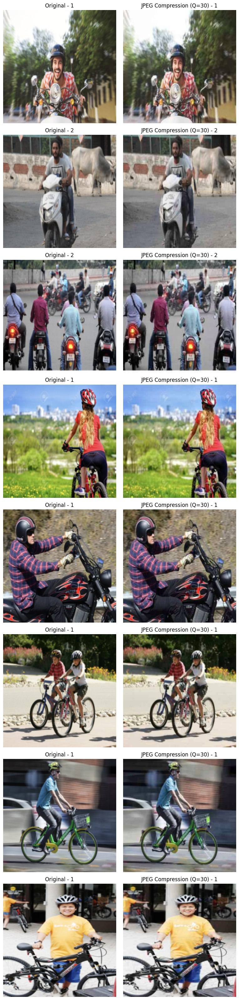

Displayed 8 samples – you should see JPEG artifacts on the right


In [21]:
# Paste this into ONE cell in your Colab notebook

import matplotlib.pyplot as plt
from torchvision import transforms, datasets
from PIL import Image
import cv2
import numpy as np
import random

# === Define JpegCompressionDegradation ===
class JpegCompressionDegradation(object):
    def __init__(self, quality=30):
        self.quality = int(quality)

    def __call__(self, img):
        img_np = np.array(img)

        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), self.quality]
        success, encimg = cv2.imencode(".jpg", img_np, encode_param)
        if not success:
            return img

        decimg = cv2.imdecode(encimg, cv2.IMREAD_COLOR)
        return Image.fromarray(decimg)

# === Dataset path ===
dataset_path = "/content/drive/MyDrive/TESIS/dataset/test/"

# === Load datasets ===
original_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Resize((224, 224))
)

compressed_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Compose([
        JpegCompressionDegradation(quality=30),  # 50 / 30 / 10
        transforms.Resize((224, 224))
    ])
)

# === Display 8 random samples ===
indices = random.sample(range(len(original_ds)), 8)

fig, axes = plt.subplots(8, 2, figsize=(8, 32))

for row, idx in enumerate(indices):
    orig_img, label = original_ds[idx]
    comp_img, _ = compressed_ds[idx]
    class_name = original_ds.classes[label]

    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"Original - {class_name}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(comp_img)
    axes[row, 1].set_title(f"JPEG Compression (Q=30) - {class_name}")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

print("Displayed 8 samples – you should see JPEG artifacts on the right")

**4.1 Inference - Compression**

In [22]:
# 1) Jalankan inference pada skenario compression
cur_probs, cur_latencies_ms = run_inference_collect(
    model, compression_loader, device
)

# 2) Hitung metric dasar (confidence, class distribution, latency)
cur_max_conf = cur_probs.max(axis=1)
cur_pos_rate = float((cur_probs[:, 1] > 0.5).mean())   # asumsi index 1 = kelas "no_helmet" / pelanggaran
p95_latency = float(np.percentile(cur_latencies_ms, 95))

# 3) Hitung stability components: PSI, KL, class distribution shift
psi, kl, class_shift = compute_stability_components(
    base_probs=base_max_conf,        # distribusi confidence baseline
    cur_probs=cur_max_conf,          # distribusi confidence di skenario compression
    base_pos_rate=baseline_pos_rate,
    cur_pos_rate=cur_pos_rate,
)

# 4) Hitung confidence stats: rata-rata, variansi, dan rasio terhadap baseline
avg_conf, var_conf, ratio_conf = compute_confidence_stats(
    probs=cur_probs,
    base_conf=baseline_conf,
)

# 5) Bungkus ke dalam ProductionMetrics
metrics_compression = ProductionMetrics(
    psi=psi,
    kl=kl,
    class_shift=class_shift,
    ratio_conf=ratio_conf,
    p95_latency_ms=p95_latency,
    baseline_p95_latency_ms=baseline_p95_latency,
    flag_rate=cur_pos_rate,
    baseline_flag_rate=baseline_flag_rate,
)

# 6) Hitung Composite Production Score (D_prod) untuk skenario compression
D_compression = compute_composite_production(metrics_compression)

print("===== Compression Scenario =====")
print("PSI          :", psi)
print("KL           :", kl)
print("Class shift  :", class_shift)
print("Conf ratio   :", ratio_conf)
print("p95 latency  :", p95_latency)
print("D_prod (compression):", D_compression)

===== Compression Scenario =====
PSI          : 0.04108738674871914
KL           : 0.019964481803873602
Class shift  : 0.02631578947368421
Conf ratio   : 0.9812481609945997
p95 latency  : 622.5783824920654
D_prod (compression): 0.892789925554085


**4. Scenario Drift - Noise (Gaussian Noise)**

**4.1 Transform - Gaussian Noise**

In [23]:
from PIL import Image
import numpy as np
from torchvision import transforms

class GaussianNoiseDegradation(object):
    """
    Menambahkan Gaussian noise ke gambar untuk mensimulasikan
    gangguan sensor / interferensi pada CCTV.
    """
    def __init__(self, mean=0.0, std=25.0):
        """
        mean: rata-rata noise (0 = netral)
        std : standar deviasi (semakin besar → noise makin kuat)
        """
        self.mean = mean
        self.std = std

    def __call__(self, img):
        # img: PIL.Image → NumPy array
        img_np = np.array(img).astype(np.float32)

        # Buat Gaussian noise
        noise = np.random.normal(self.mean, self.std, img_np.shape).astype(np.float32)

        # Tambahkan noise
        noisy = img_np + noise

        # Clip agar tetap di [0,255]
        noisy = np.clip(noisy, 0, 255).astype(np.uint8)

        # Kembali ke PIL.Image
        return Image.fromarray(noisy)


# Transform lengkap untuk skenario noise
noise_transform = transforms.Compose([
    GaussianNoiseDegradation(mean=0.0, std=25.0),  # bisa dinaikkan std jadi 40/50 untuk noise lebih parah
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

**4.2 Dataset & DataLoader - Noise**

In [24]:
from torchvision import datasets
from torch.utils.data import DataLoader
import os

noise_dataset_path = "/content/drive/MyDrive/TESIS/dataset/test"

print("Isi folder dataset1 (noise):", os.listdir(noise_dataset_path))

noise_dataset = datasets.ImageFolder(
    root=noise_dataset_path,
    transform=noise_transform,
)

print("Kelas & index:", noise_dataset.class_to_idx)
print("Total images (noise):", len(noise_dataset))

noise_loader = DataLoader(
    noise_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("✅ noise_loader created")

Isi folder dataset1 (noise): ['1', '2']
Kelas & index: {'1': 0, '2': 1}
Total images (noise): 76
✅ noise_loader created


**4.3 Preview Images - Gaussian Noise**

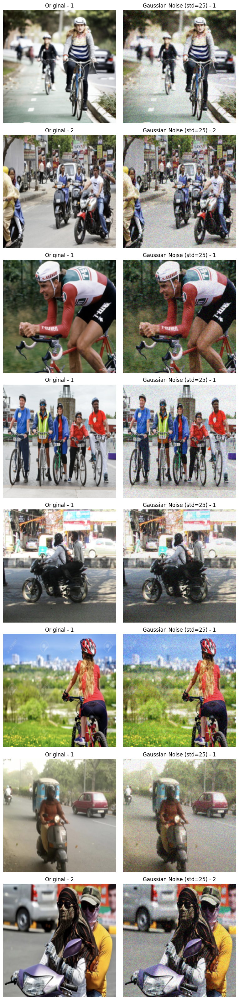

Displayed 8 samples – you should see grainy noise on the right


In [25]:
# Paste this into ONE cell in your Colab notebook

import matplotlib.pyplot as plt
from torchvision import transforms, datasets
from PIL import Image
import numpy as np
import random

# === Define GaussianNoiseDegradation ===
class GaussianNoiseDegradation(object):
    def __init__(self, mean=0.0, std=25.0):
        self.mean = mean
        self.std = std

    def __call__(self, img):
        img_np = np.array(img).astype(np.float32)
        noise = np.random.normal(self.mean, self.std, img_np.shape).astype(np.float32)
        noisy = img_np + noise
        noisy = np.clip(noisy, 0, 255).astype(np.uint8)
        return Image.fromarray(noisy)

# === Dataset path ===
dataset_path = "/content/drive/MyDrive/TESIS/dataset/test/"

# === Load datasets ===
original_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Resize((224, 224))
)

noisy_ds = datasets.ImageFolder(
    dataset_path,
    transform=transforms.Compose([
        GaussianNoiseDegradation(mean=0.0, std=25.0),  # try std=40 or 50
        transforms.Resize((224, 224))
    ])
)

# === Display 8 random samples ===
indices = random.sample(range(len(original_ds)), 8)

fig, axes = plt.subplots(8, 2, figsize=(8, 32))

for row, idx in enumerate(indices):
    orig_img, label = original_ds[idx]
    noisy_img, _ = noisy_ds[idx]
    class_name = original_ds.classes[label]

    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"Original - {class_name}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(noisy_img)
    axes[row, 1].set_title(f"Gaussian Noise (std=25) - {class_name}")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

print("Displayed 8 samples – you should see grainy noise on the right")


**4.4 Inference - Noise**

In [26]:
# 1) Jalankan inference pada skenario noise
cur_probs, cur_latencies_ms = run_inference_collect(
    model, noise_loader, device
)

# 2) Hitung metric dasar (confidence, class distribution, latency)
cur_max_conf = cur_probs.max(axis=1)
cur_pos_rate = float((cur_probs[:, 1] > 0.5).mean())  # asumsi index 1 = kelas "no_helmet" / pelanggaran
p95_latency = float(np.percentile(cur_latencies_ms, 95))

# 3) Hitung stability components: PSI, KL, class distribution shift
psi, kl, class_shift = compute_stability_components(
    base_probs=base_max_conf,
    cur_probs=cur_max_conf,
    base_pos_rate=baseline_pos_rate,
    cur_pos_rate=cur_pos_rate,
)

# 4) Hitung confidence stats: rata-rata, variansi, dan rasio terhadap baseline
avg_conf, var_conf, ratio_conf = compute_confidence_stats(
    probs=cur_probs,
    base_conf=baseline_conf,
)

# 5) Bungkus ke dalam ProductionMetrics
metrics_noise = ProductionMetrics(
    psi=psi,
    kl=kl,
    class_shift=class_shift,
    ratio_conf=ratio_conf,
    p95_latency_ms=p95_latency,
    baseline_p95_latency_ms=baseline_p95_latency,
    flag_rate=cur_pos_rate,
    baseline_flag_rate=baseline_flag_rate,
)

# 6) Hitung Composite Production Score (D_prod) untuk skenario noise
D_noise = compute_composite_production(metrics_noise)

print("===== Noise Scenario =====")
print("PSI          :", psi)
print("KL           :", kl)
print("Class shift  :", class_shift)
print("Conf ratio   :", ratio_conf)
print("p95 latency  :", p95_latency)
print("D_prod (noise):", D_noise)

===== Noise Scenario =====
PSI          : 0.4404365702365255
KL           : 0.22723821718718978
Class shift  : 0.09210526315789473
Conf ratio   : 0.9001120435985882
p95 latency  : 402.9521703720093
D_prod (noise): 0.5725033293180225


**Single Metric**

In [27]:
single_vs_composite = []

single_lighting = compute_single_metric(metrics_lighting)
single_vs_composite.append({
    "Scenario": "Lighting Degradation",
    "SingleMetric": single_lighting,
    "D_prod": D_lighting,
})

single_blur = compute_single_metric(metrics_blur)
single_vs_composite.append({
    "Scenario": "Blur Degradation",
    "SingleMetric": single_blur,
    "D_prod": D_blur,
})

single_compression = compute_single_metric(metrics_compression)
single_vs_composite.append({
    "Scenario": "Compression (JPEG)",
    "SingleMetric": single_compression,
    "D_prod": D_compression,
})

single_noise = compute_single_metric(metrics_noise)
single_vs_composite.append({
    "Scenario": "Gaussian Noise",
    "SingleMetric": single_noise,
    "D_prod": D_noise,
})

single_vs_composite

[{'Scenario': 'Lighting Degradation',
  'SingleMetric': 0.7896907417455757,
  'D_prod': 0.4276047247017364},
 {'Scenario': 'Blur Degradation',
  'SingleMetric': 0.9822998551132608,
  'D_prod': 0.8916927964224243},
 {'Scenario': 'Compression (JPEG)',
  'SingleMetric': 0.9812481609945997,
  'D_prod': 0.892789925554085},
 {'Scenario': 'Gaussian Noise',
  'SingleMetric': 0.9001120435985882,
  'D_prod': 0.5725033293180225}]

**Visualisasi Perubahan Confidence Ratio pada Berbagai Skenario Degradasi**

/tmp/ipython-input-1791858081.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Scenario', y='SingleMetric', data=df_results, palette='viridis')


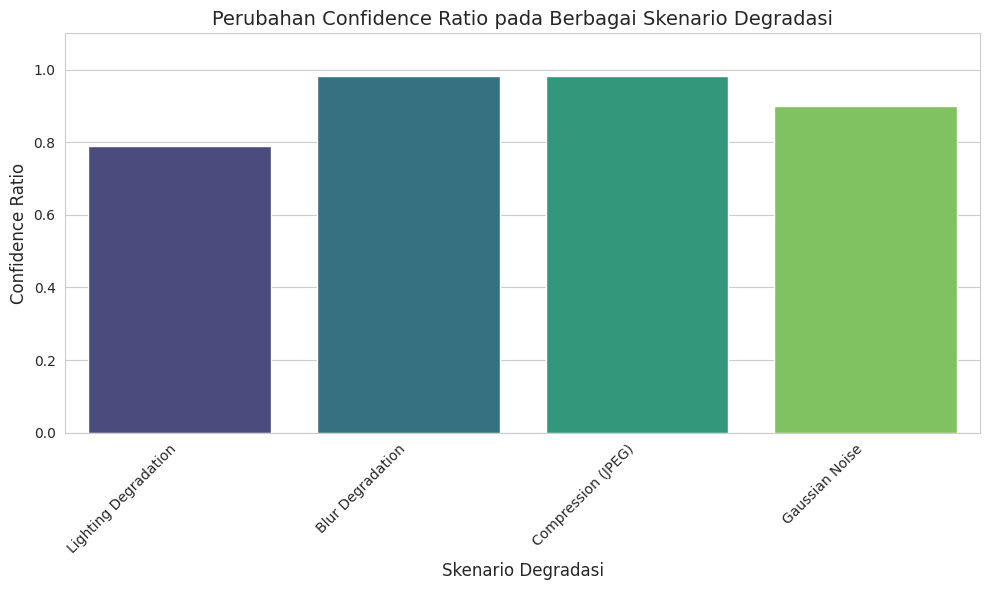

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the list of dictionaries to a pandas DataFrame
df_results = pd.DataFrame(single_vs_composite)

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.barplot(x='Scenario', y='SingleMetric', data=df_results, palette='viridis')

plt.title('Perubahan Confidence Ratio pada Berbagai Skenario Degradasi', fontsize=14)
plt.xlabel('Skenario Degradasi', fontsize=12)
plt.ylabel('Confidence Ratio', fontsize=12)
plt.ylim(0.0, 1.1) # Set y-axis limit to clearly show values between 0 and 1
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

### Visualisasi Perubahan PSI (Population Stability Index) pada Berbagai Skenario Degradasi

/tmp/ipython-input-2675009594.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Scenario', y='PSI', data=df_psi_results, palette='magma')


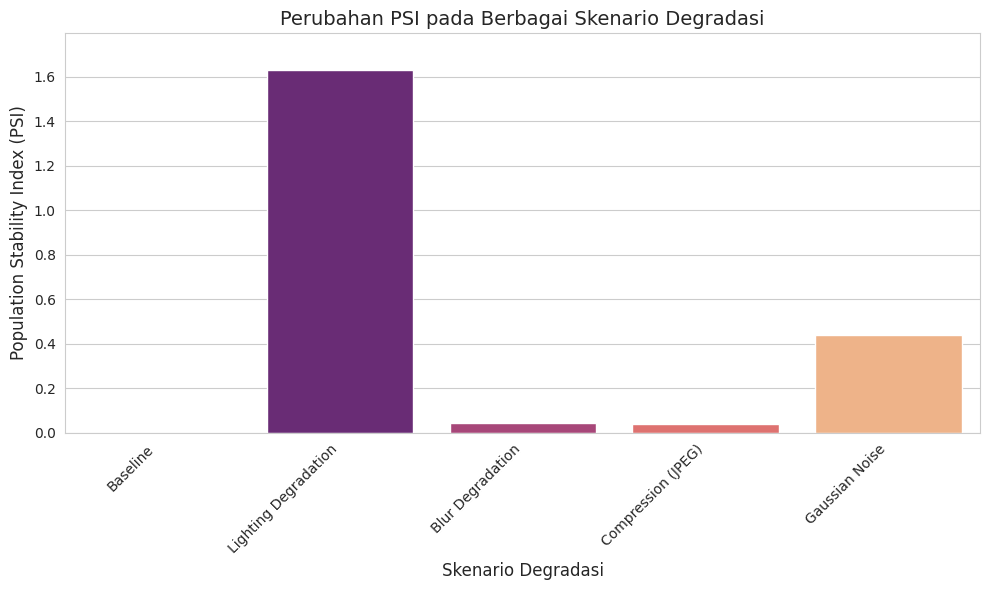

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for PSI visualization
psi_results = []

# Add baseline PSI (which is 0 by definition for the baseline)
psi_results.append({
    "Scenario": "Baseline",
    "PSI": 0.0
})

psi_results.append({
    "Scenario": "Lighting Degradation",
    "PSI": metrics_lighting.psi
})

psi_results.append({
    "Scenario": "Blur Degradation",
    "PSI": metrics_blur.psi
})

psi_results.append({
    "Scenario": "Compression (JPEG)",
    "PSI": metrics_compression.psi
})

psi_results.append({
    "Scenario": "Gaussian Noise",
    "PSI": metrics_noise.psi
})

df_psi_results = pd.DataFrame(psi_results)

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.barplot(x='Scenario', y='PSI', data=df_psi_results, palette='magma')

plt.title('Perubahan PSI pada Berbagai Skenario Degradasi', fontsize=14)
plt.xlabel('Skenario Degradasi', fontsize=12)
plt.ylabel('Population Stability Index (PSI)', fontsize=12)
plt.ylim(0.0, df_psi_results['PSI'].max() * 1.1) # Dynamic y-axis limit
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Visualisasi Perubahan KL Divergence pada Berbagai Skenario Degradasi

/tmp/ipython-input-2531660024.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Scenario', y='KL_Divergence', data=df_kl_results, palette='cubehelix')


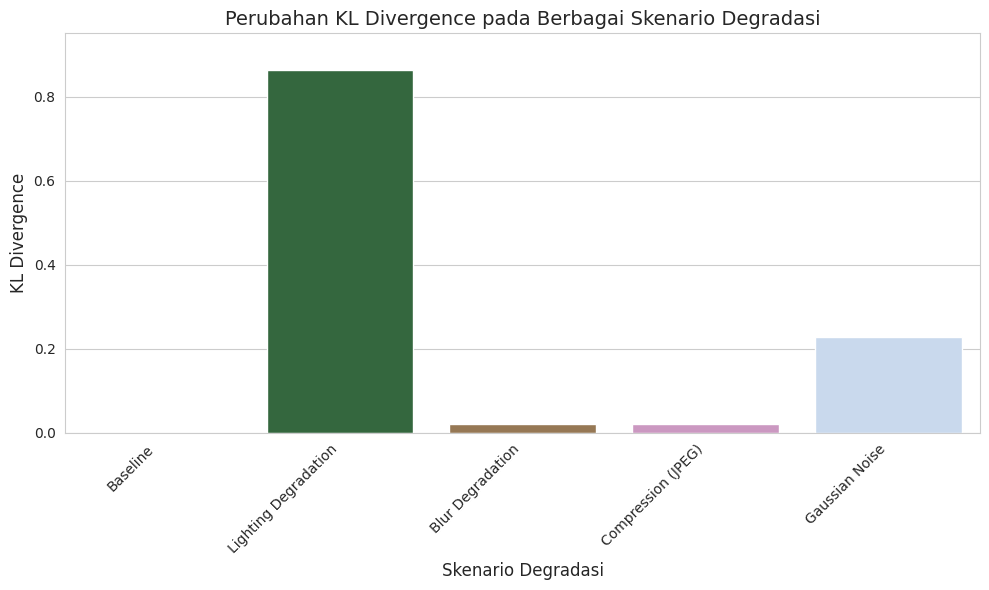

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for KL Divergence visualization
kl_results = []

# Add baseline KL Divergence (which is 0 by definition for the baseline)
kl_results.append({
    "Scenario": "Baseline",
    "KL_Divergence": 0.0
})

kl_results.append({
    "Scenario": "Lighting Degradation",
    "KL_Divergence": metrics_lighting.kl
})

kl_results.append({
    "Scenario": "Blur Degradation",
    "KL_Divergence": metrics_blur.kl
})

kl_results.append({
    "Scenario": "Compression (JPEG)",
    "KL_Divergence": metrics_compression.kl
})

kl_results.append({
    "Scenario": "Gaussian Noise",
    "KL_Divergence": metrics_noise.kl
})

df_kl_results = pd.DataFrame(kl_results)

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.barplot(x='Scenario', y='KL_Divergence', data=df_kl_results, palette='cubehelix')

plt.title('Perubahan KL Divergence pada Berbagai Skenario Degradasi', fontsize=14)
plt.xlabel('Skenario Degradasi', fontsize=12)
plt.ylabel('KL Divergence', fontsize=12)
plt.ylim(0.0, df_kl_results['KL_Divergence'].max() * 1.1) # Dynamic y-axis limit
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Visualisasi Perubahan Latency Inference (P95) pada Berbagai Skenario Degradasi

/tmp/ipython-input-900225071.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Scenario', y='P95_Latency_ms', data=df_latency_results, palette='crest')


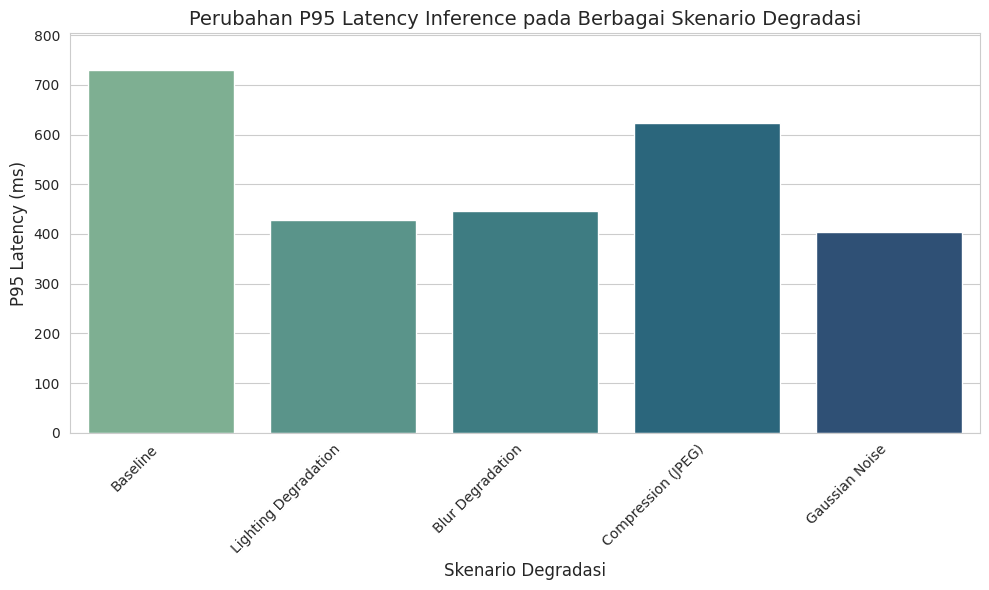

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for Latency visualization
latency_results = []

# Add baseline latency
latency_results.append({
    "Scenario": "Baseline",
    "P95_Latency_ms": metrics_baseline.p95_latency_ms
})

latency_results.append({
    "Scenario": "Lighting Degradation",
    "P95_Latency_ms": metrics_lighting.p95_latency_ms
})

latency_results.append({
    "Scenario": "Blur Degradation",
    "P95_Latency_ms": metrics_blur.p95_latency_ms
})

latency_results.append({
    "Scenario": "Compression (JPEG)",
    "P95_Latency_ms": metrics_compression.p95_latency_ms
})

latency_results.append({
    "Scenario": "Gaussian Noise",
    "P95_Latency_ms": metrics_noise.p95_latency_ms
})

df_latency_results = pd.DataFrame(latency_results)

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.barplot(x='Scenario', y='P95_Latency_ms', data=df_latency_results, palette='crest')

plt.title('Perubahan P95 Latency Inference pada Berbagai Skenario Degradasi', fontsize=14)
plt.xlabel('Skenario Degradasi', fontsize=12)
plt.ylabel('P95 Latency (ms)', fontsize=12)
plt.ylim(0.0, df_latency_results['P95_Latency_ms'].max() * 1.1) # Dynamic y-axis limit
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Visualisasi Perubahan Composite Health Score (D_prod) pada Berbagai Skenario Degradasi

/tmp/ipython-input-1758360752.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Scenario', y='D_prod', data=df_d_prod_results, palette='plasma')


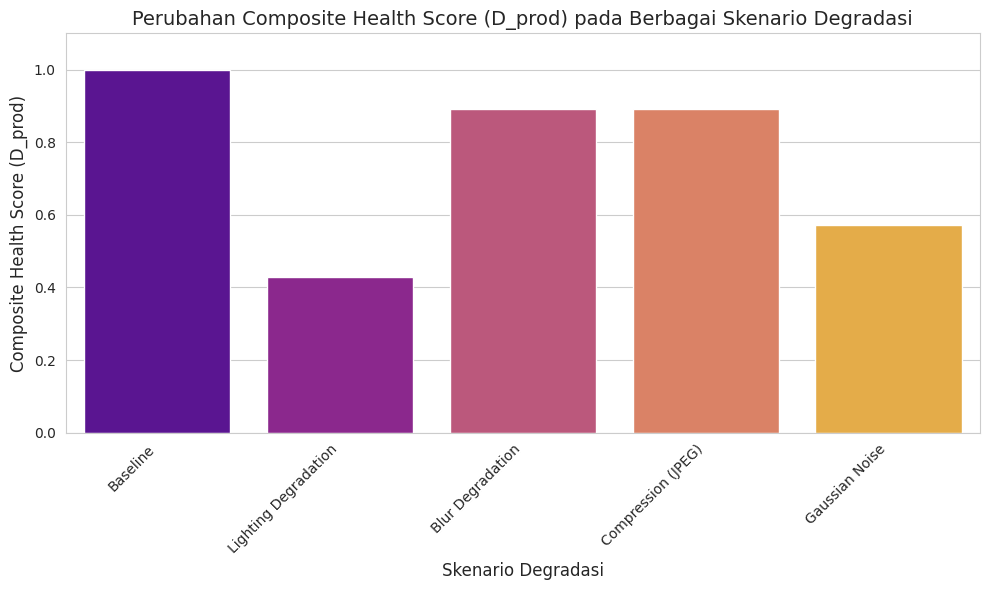

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for D_prod visualization
d_prod_results = []

# Add baseline D_prod
d_prod_results.append({
    "Scenario": "Baseline",
    "D_prod": D_baseline
})

# Add D_prod for other scenarios from single_vs_composite
for item in single_vs_composite:
    d_prod_results.append({
        "Scenario": item["Scenario"],
        "D_prod": item["D_prod"]
    })

df_d_prod_results = pd.DataFrame(d_prod_results)

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.barplot(x='Scenario', y='D_prod', data=df_d_prod_results, palette='plasma')

plt.title('Perubahan Composite Health Score (D_prod) pada Berbagai Skenario Degradasi', fontsize=14)
plt.xlabel('Skenario Degradasi', fontsize=12)
plt.ylabel('Composite Health Score (D_prod)', fontsize=12)
plt.ylim(0.0, 1.1) # D_prod is between 0 and 1
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Fungsi Pembantu untuk Deteksi Degradasi Berbasis Batch

In [33]:
# Define thresholds for D_prod (Multi-Metric)
D_PROD_THRESHOLDS = {
    "healthy": 0.8,
    "degraded_lower": 0.6,
    "degraded_upper": 0.79
}

# Define thresholds for Confidence Ratio (Single-Metric)
# (Proposed, can be adjusted by user)
CONF_RATIO_THRESHOLDS = {
    "healthy": 0.9,
    "degraded_lower": 0.8,
    "degraded_upper": 0.89
}

def get_degradation_status(score: float, metric_type: str) -> str:
    """Determines the degradation status based on score and metric type."""
    if metric_type == "D_prod":
        thresholds = D_PROD_THRESHOLDS
    elif metric_type == "confidence_ratio":
        thresholds = CONF_RATIO_THRESHOLDS
    else:
        raise ValueError("Invalid metric_type. Use 'D_prod' or 'confidence_ratio'.")

    if score >= thresholds["healthy"]:
        return "Healthy"
    elif score >= thresholds["degraded_lower"] and score <= thresholds["degraded_upper"]:
        return "Degraded"
    else:
        return "Critical"

def run_batch_inference_and_metrics(
    model,
    dataloader,
    device,
    base_max_conf: np.ndarray,
    baseline_pos_rate: float,
    baseline_conf: float,
    baseline_p95_latency: float,
    baseline_flag_rate: float,
):
    """
    Performs inference batch by batch and calculates ProductionMetrics, D_prod,
    and Confidence Ratio for each batch.
    """
    model.eval()
    all_batch_results = []

    with torch.no_grad():
        for batch_idx, (imgs, _) in enumerate(dataloader):
            imgs = imgs.to(device)
            start = time.time()
            logits = model(imgs)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            end = time.time()

            elapsed_ms = (end - start) * 1000.0
            # For P95 latency of a single batch, we just use the elapsed time for that batch.
            # For a true P95 over many batches, more sophisticated tracking would be needed.
            # For simplicity here, we'll just use the batch latency as a proxy.
            batch_p95_latency = float(elapsed_ms)

            batch_max_conf = probs.max(axis=1)
            batch_cur_pos_rate = float((probs[:, 1] > 0.5).mean())

            # Stability metrics for current batch vs baseline
            psi, kl, class_shift = compute_stability_components(
                base_probs=base_max_conf,  # Baseline confidence distribution
                cur_probs=batch_max_conf,  # Current batch confidence distribution
                base_pos_rate=baseline_pos_rate,
                cur_pos_rate=batch_cur_pos_rate,
            )

            # Confidence metrics for current batch vs baseline
            avg_conf, var_conf, ratio_conf = compute_confidence_stats(
                probs=probs,
                base_conf=baseline_conf,
            )

            # Pack metrics for the current batch
            batch_metrics = ProductionMetrics(
                psi=psi,
                kl=kl,
                class_shift=class_shift,
                ratio_conf=ratio_conf,
                p95_latency_ms=batch_p95_latency,
                baseline_p95_latency_ms=baseline_p95_latency,
                flag_rate=batch_cur_pos_rate,
                baseline_flag_rate=baseline_flag_rate,
            )

            # Calculate D_prod for the current batch
            D_prod_batch = compute_composite_production(batch_metrics)

            all_batch_results.append({
                "batch_idx": batch_idx + 1,
                "D_prod": D_prod_batch,
                "confidence_ratio": ratio_conf,
                "metrics": batch_metrics
            })
    return all_batch_results

def find_first_degraded_batch(
    batch_results: List[Dict],
    metric_type: str,
    degradation_status_to_find: List[str] = ["Degraded", "Critical"]
) -> Optional[int]:
    """
    Finds the index of the first batch that reaches a specified degradation status
    for a given metric type.
    """
    for result in batch_results:
        score = result[metric_type]
        status = get_degradation_status(score, metric_type)
        if status in degradation_status_to_find:
            return result["batch_idx"]
    return None

print("✅ Helper functions for batch-wise degradation detection defined.")

✅ Helper functions for batch-wise degradation detection defined.


### Jalankan Deteksi Degradasi Berbasis Batch untuk Setiap Skenario

In [34]:
detection_results_table = []

scenarios = {
    "Lighting Degradation": lighting_loader,
    "Blur Degradation": blur_loader,
    "Compression (JPEG)": compression_loader,
    "Gaussian Noise": noise_loader,
}

for scenario_name, dataloader in scenarios.items():
    print(f"\nProcessing scenario: {scenario_name}")
    batch_results = run_batch_inference_and_metrics(
        model, dataloader, device,
        base_max_conf=base_max_conf,
        baseline_pos_rate=baseline_pos_rate,
        baseline_conf=baseline_conf,
        baseline_p95_latency=baseline_p95_latency,
        baseline_flag_rate=baseline_flag_rate,
    )

    # Find first degraded batch for Single-Metric
    first_degraded_single = find_first_degraded_batch(batch_results, "confidence_ratio")

    # Find first degraded batch for Multi-Metrics (D_prod)
    first_degraded_dprod = find_first_degraded_batch(batch_results, "D_prod")

    detection_results_table.append({
        "Skenario": scenario_name,
        "Single-Metric (Batch ke-)": first_degraded_single if first_degraded_single is not None else "Not Degraded",
        "Multi-Metrics (Batch ke-)": first_degraded_dprod if first_degraded_dprod is not None else "Not Degraded",
    })


print("\n--- Tabel Perbandingan Waktu Deteksi Degradasi ---")
df_detection = pd.DataFrame(detection_results_table)
display(df_detection)

# Optional: Display full batch results for a specific scenario for debugging/details
# print("\nDetailed batch results for Lighting Degradation:")
# pd.DataFrame(batch_results_lighting_degradation).set_index('batch_idx')



Processing scenario: Lighting Degradation


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)



Processing scenario: Blur Degradation

Processing scenario: Compression (JPEG)

Processing scenario: Gaussian Noise

--- Tabel Perbandingan Waktu Deteksi Degradasi ---


,Skenario,Single-Metric (Batch ke-),Multi-Metrics (Batch ke-)
0,Lighting Degradation,1,1
1,Blur Degradation,3,1
2,Compression (JPEG),3,1
3,Gaussian Noise,2,1


from matplotlib import pyplot as plt
df_detection['Single-Metric (Batch ke-)'].plot(kind='hist', bins=20, title='Single-Metric (Batch ke-)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
df_detection.groupby('Skenario').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Multi-Metrics (Batch ke-)']
  ys = series['Single-Metric (Batch ke-)']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_detection.sort_values('Multi-Metrics (Batch ke-)', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Skenario')):
  _plot_series(series, series_name, i)
  fig.legend(title='Skenario', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Multi-Metrics (Batch ke-)')
_ = plt.ylabel('Single-Metric (Batch ke-)')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Multi-Metrics (Batch ke-)']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Multi-Metrics (Batch ke-)'}, axis=1)
              .sort_values('Multi-Metrics (Batch ke-)', ascending=True))
  xs = counted['Multi-Metrics (Batch ke-)']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_detection.sort_values('Multi-Metrics (Batch ke-)', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Skenario')):
  _plot_series(series, series_name, i)
  fig.legend(title='Skenario', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Multi-Metrics (Batch ke-)')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
df_detection['Single-Metric (Batch ke-)'].plot(kind='line', figsize=(8, 4), title='Single-Metric (Batch ke-)')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df_detection['Skenario'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df_detection, x='Single-Metric (Batch ke-)', y='Skenario', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)